##### Purpose of the notebook ####

In [7]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import infercnvpy as cnv
import squidpy as sq

/home/sergio/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/sergio/.local/lib/python3.10/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/home/sergio/.local/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


# Read adata

In [5]:
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
adata=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_moments_cnvinfered.h5ad')

# Code with infercnv (change kernel to infercnv)

In [6]:
cnv_clusters=['13','0','5','4','21','14','1','10']
adata.obs['malignant_clusters']=adata.obs['cnv_leiden'].isin(cnv_clusters)
adata.obs.loc[adata.obs['malignant_clusters'],'malignant_clusters']=adata.obs.loc[adata.obs['malignant_clusters'],'cnv_leiden']
adata.obs['malignant_clusters']=adata.obs['malignant_clusters'].astype(str)

/tmp/ipykernel_48305/2280018645.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['0', '0', '5', '0', '1', ..., '5', '4', '10', '13', '0']
Length: 357081
Categories (17, object): ['0', '1', '2', '3', ..., '13', '14', '15', '16']' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.
  adata.obs.loc[adata.obs['malignant_clusters'],'malignant_clusters']=adata.obs.loc[adata.obs['malignant_clusters'],'cnv_leiden']


... storing 'malignant_clusters' as categorical


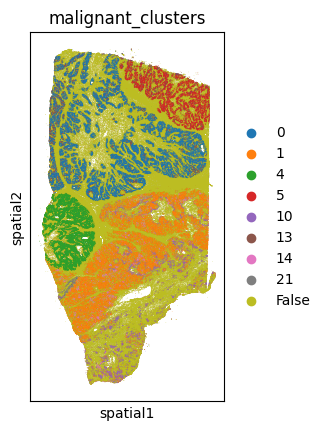

In [14]:
sc.pl.spatial(adata,color='malignant_clusters',spot_size=30)

In [10]:
adata_tme=adata[adata.obs['malignant_clusters']=='False']

In [11]:
adata_tme.shape

(348202, 4616)

In [17]:
from tqdm import tqdm
def format_data_neighs_colapse(adata,condit,nbrs=10):
    try:
        adata.obsm['spatial']
    except:
        adata.obsm["spatial"]=np.array([adata.obs.X,adata.obs.Y]).transpose().astype('float64')
    adata_copy_int=adata
    sq.gr.spatial_neighbors(adata_copy_int,n_neighs=nbrs)
    result=np.zeros([adata.shape[0],adata.shape[1]])
    n=0
    tr=adata_copy_int.obsp['spatial_distances'].transpose()
    tr2=tr>0
    exp=adata_copy_int.to_df()
    for i in tqdm(range(0,adata_copy_int.to_df().shape[0])):
        result[i,:]=np.sum(exp[tr2[i,:].todense().transpose()],axis=0)
    adata1=sc.AnnData(result,obs=adata.obs,var=adata.var)
    return adata1

In [22]:
sq.gr.spatial_neighbors(adata_tme,n_neighs=10)

/home/sergio/.local/lib/python3.10/site-packages/squidpy/gr/_utils.py:203: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


In [ ]:
result=np.zeros([adata_tme.shape[0],adata.shape[1]])
n=0
tr=adata_tme.obsp['spatial_distances'].transpose()
tr2=tr>0
exp=adata_tme.to_df()
for i in tqdm(range(0,adata_tme.to_df().shape[0])):
    result[i,:]=np.sum(exp[tr2[i,:].todense().transpose()],axis=0)
adata1=sc.AnnData(result,obs=adata.obs,var=adata.var)

 60%|█████████████████████████████████████████████                              | 209263/348202 [42:07<40:10, 57.64it/s]

In [ ]:
adata1.write('/media/sergio/Ymir/5kovarian_for_cnv/adata_tme_ovarian_nbr.h5ad')

# Identify clusters

In [21]:
import numpy as np
from scipy.spatial import KDTree
import anndata as ad

# Ensure your AnnData object has spatial coordinates in adata.obsm['spatial']
if 'spatial' not in adata.obsm:
    raise ValueError("Spatial coordinates not found in adata.obsm['spatial']")

# Extract spatial coordinates and expression data
spatial_coords = adata.obsm['spatial']

expression_data = adata.X  # Assuming adata.X contains the expression data

spatial_healthy=spatial_coords[adata.obs['malignant_clusters']=='False']
spatial_malignant=spatial_coords[adata.obs['malignant_clusters']!='False']

expression_healthy=expression_data[adata.obs['malignant_clusters']=='False']
expression_malignant=expression_data[adata.obs['malignant_clusters']!='False']

# Build a KDTree for efficient neighbor searching
tree = KDTree(spatial_healthy)

# Find the 30 closest neighbors for each cell
n_neighbors = 10
_, indices = tree.query(spatial_malignant, k=n_neighbors + 1)  # Include the cell itself in neighbors


In [ ]:
# Aggregate expression data over the neighbors
aggregated_expression = np.array([np.mean(expression_healthy[indices[i, 1:], :], axis=0) for i in range(adata.n_obs)])

In [ ]:
aggregated_expression.shape

In [15]:
# Add the aggregated data to a new layer in AnnData
adata.layers['neighbor_aggregated'] = aggregated_expression


KeyboardInterrupt: 

# Neighboring cells of each cluster

# Analysis of cnvs across window_sizes

In [31]:
sc.pp.subsample(adata,0.1)

In [81]:
cells_selected=list(adata.obs.loc[adata.obs['cnv_leiden']=='0','cell_id'])

In [82]:
window_sizes=[1,5,10,20,40,60,100,150,200]

In [ ]:
results=pd.DataFrame(index=window_sizes,columns=adata.var.index)
for win_size in window_sizes:
    cnv.tl.infercnv(adata,reference_key="cell class",
    reference_cat=['Monocytes','B cells','T cells','Endothelial','Low expression','Fibroblasts']
     ,window_size=win_size,layer='M',calculate_gene_values=True)
    results.loc[win_size,:]=np.mean(adata.layers["gene_values_cnv"][adata.obs['cell_id'].isin(cells_selected),:],axis=0)

  0%|                                                                                             | 0/3 [00:00<?, ?it/s]

In [ ]:
df_sorted = adata.var.sort_values(by=['chromosome', 'start'], ascending=[True, True])
results_sorted=results.loc[:,df_sorted.index]

In [ ]:
colors = [
    "#FFFF00",  # Bright Yellow
    "#E6FF33",  # Light Yellow-Green
    "#CCFF66",  # Lemon Green
    "#B3FF99",  # Light Lime
    "#99FFCC",  # Mint Green
    "#80FFBF",  # Seafoam Green
    "#66FF99",  # Bright Green
    "#33FF66",  # Lime Green
    "#00FF33",  # Green
    "#00FF66",  # Emerald Green
    "#00FF99",  # Aqua Green
    "#00FFFF",  # Cyan/Teal
    "#0099FF",  # Bright Blue
    "#0066FF",  # Royal Blue
    "#3300FF",  # Blue
    "#6600FF",  # Indigo
    "#9900FF",  # Violet
    "#CC00FF",  # Purple
    "#FF00FF",  # Magenta
    "#FF0099",  # Hot Pink
    "#FF0066",  # Rose
    "#FF0033",  # Bright Red
    "#FF3300",  # Orange-Red
    "#FF0000"   # Red
]
cool=dict(zip(np.unique(df_sorted['chromosome']),colors))

In [ ]:
sns.clustermap(results_sorted.astype(float),cmap='coolwarm',vmax=0.3,vmin=-0.3,col_cluster=False,row_cluster=False,
              figsize=(10,4),col_colors=df_sorted['chromosome'].map(cool))
plt.title('Chromosome gain/loss depending on windows_size')

<BarContainer object of 4993 artists>

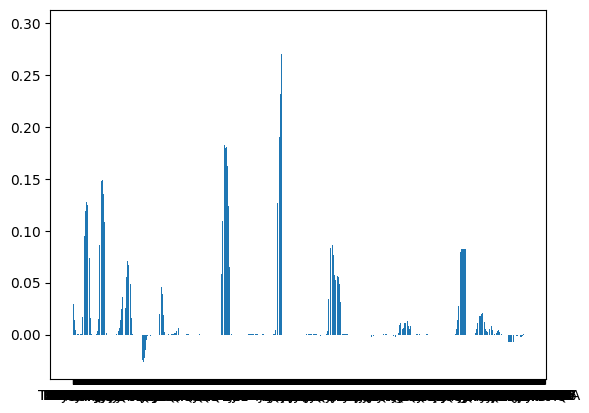

In [48]:
plt.bar(results.columns,height=results.iloc[0,:])

# VERY RELEVANT 
TAP1, TAP2 and CFB are all present in the same locus. (6p21.3) -Interferon

While the same occurs for IFIT1 and IFIT3 (10q23.31) - MHC

GATA4 and SFRP1 are located in 8p and could also generate the CNV we observe in cnv cluster 8

In [ ]:
sc.tl.rank_genes_groups(adata,groupby='cnv_leiden')

In [108]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=15)